# DA Mini Project
* 주제 : 온라인 학습 플랫폼 사용자 행동 패턴 분석
* 개요 :
```
이번 프로젝트는 학습 서비스를 이용하는 독자들 중 누가 서비스 구독을 연장할지 예측하기 위한 사전 파악에 초점을 맞추고 있습니다. 우리의 목표는 유저들의 학습 습관, 선호도, 이용 행태 등 다양한 측면을 면밀히 분석하는 것입니다.


이를 위해, 우리는 유저들의 학습 패턴, 서비스 이용 시간, 콘텐츠에 대한 반응, 그리고 이들이 얼마나 자주 서비스를 이용하는지 등 다양한 데이터를 수집하고 분석할 계획입니다. 이 데이터는 유저들이 서비스에 얼마나 만족하고 있는지, 어떤 요소들이 그들의 구독 결정에 영향을 미치는지 이해하는 데 중요한 역할을 할 것입니다.
```
* 데이터셋 : mini.csv
    * 메타데이터
        * user_id: 사용자의 고유 식별자
        * subscription_duration: 사용자가 서비스에 가입한 기간 (월)
        * recent_login_time: 사용자가 마지막으로 로그인한 시간 (일)
        * average_login_time:  사용자의 일반적인 로그인 시간
        * average_time_per_learning_session: 각 학습 세션에 소요된 평균 시간 (분)
        * monthly_active_learning_days: 월간 활동적인 학습 일수
        * total_completed_courses: 완료한 총 코스 수
        * recent_learning_achievement: 최근 학습 성취도
        * abandoned_learning_sessions: 중단된 학습 세션 수
        * community_engagement_level: 커뮤니티 참여도
        * preferred_difficulty_level: 선호하는 난이도
        * subscription_type: 구독 유형
        * customer_inquiry_history: 고객 문의 이력
        * payment_pattern : 사용자의 지난 3개월 간의 결제 패턴을 10진수로 표현한 값.
          - 7: 3개월 모두 결제함
          - 6: 첫 2개월은 결제했으나 마지막 달에는 결제하지 않음
          - 5: 첫 달과 마지막 달에 결제함
          - 4: 첫 달에만 결제함
          - 3: 마지막 2개월에 결제함
          - 2: 가운데 달에만 결제함
          - 1: 마지막 달에만 결제함
          - 0: 3개월 동안 결제하지 않음
        * target: 사용자가 다음 달에도 구독을 계속할지 (1) 또는 취소할지 (0)를 나타냄

In [2]:
import pandas as pd

In [244]:
data = pd.read_csv('data/mini.csv') # 데이터 불러오기

In [4]:
data.head() # 데이터 확인

,user_id,subscription_duration,recent_login_time,average_login_time,average_time_per_learning_session,monthly_active_learning_days,total_completed_courses,recent_learning_achievement,abandoned_learning_sessions,community_engagement_level,preferred_difficulty_level,subscription_type,customer_inquiry_history,payment_pattern,target
0,b919c29d,13,14,14.946163,8.427187,18,16,68.360455,3,4,Low,Basic,4,5,0
1,a0a60abb,16,18,18.453224,72.646087,16,13,97.567322,2,3,Medium,Basic,1,6,1
2,b9f171ae,22,1,16.195228,21.774492,13,14,94.358763,3,4,Medium,Premium,0,7,1
3,5dc0ba8b,1,19,17.628656,42.659066,19,18,70.153228,0,3,Low,Basic,1,0,1
4,65c83654,4,5,21.390656,30.744287,19,10,81.917908,2,4,Medium,Basic,3,0,1


In [5]:
data.tail() 

,user_id,subscription_duration,recent_login_time,average_login_time,average_time_per_learning_session,monthly_active_learning_days,total_completed_courses,recent_learning_achievement,abandoned_learning_sessions,community_engagement_level,preferred_difficulty_level,subscription_type,customer_inquiry_history,payment_pattern,target
9995,ae6b76bc,22,29,14.727623,84.053558,18,16,64.966803,2,5,Low,Premium,1,1,1
9996,24588752,10,11,19.374054,45.464833,9,8,82.750244,3,3,Medium,Basic,2,7,1
9997,e4622a54,7,27,18.240978,127.302411,24,14,81.567839,3,5,High,Basic,1,6,1
9998,e07fbad9,11,7,18.783800,5.297234,10,10,89.885656,4,5,Low,Basic,2,0,1
9999,e12dcb55,10,5,13.073230,28.120031,3,13,64.811297,4,5,Low,Premium,0,3,0


In [6]:
data.info() #데이터프레임 구조 확인

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 15 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   user_id                            10000 non-null  object 
 1   subscription_duration              10000 non-null  int64  
 2   recent_login_time                  10000 non-null  int64  
 3   average_login_time                 10000 non-null  float64
 4   average_time_per_learning_session  10000 non-null  float64
 5   monthly_active_learning_days       10000 non-null  int64  
 6   total_completed_courses            10000 non-null  int64  
 7   recent_learning_achievement        10000 non-null  float64
 8   abandoned_learning_sessions        10000 non-null  int64  
 9   community_engagement_level         10000 non-null  int64  
 10  preferred_difficulty_level         10000 non-null  object 
 11  subscription_type                  10000 non-null  obje

In [53]:
data.isnull().sum() #결측치 확인

user_id                              0
subscription_duration                0
recent_login_time                    0
average_login_time                   0
average_time_per_learning_session    0
monthly_active_learning_days         0
total_completed_courses              0
recent_learning_achievement          0
abandoned_learning_sessions          0
community_engagement_level           0
preferred_difficulty_level           0
subscription_type                    0
customer_inquiry_history             0
payment_pattern                      0
target                               0
dtype: int64

In [7]:
data.target.value_counts() # target 데이터 확인

target
1    6199
0    3801
Name: count, dtype: int64

In [57]:
digital_data = data[['subscription_duration', 'recent_login_time', 'average_login_time','average_time_per_learning_session', 'monthly_active_learning_days',
                'total_completed_courses', 'recent_learning_achievement', 'abandoned_learning_sessions','community_engagement_level', 'customer_inquiry_history']]

digital_data.describe() #수치형 데이터 확인

,subscription_duration,recent_login_time,average_login_time,average_time_per_learning_session,monthly_active_learning_days,total_completed_courses,recent_learning_achievement,abandoned_learning_sessions,community_engagement_level,customer_inquiry_history
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,11.897400,15.013200,14.994076,54.917720,12.545400,12.227500,75.029513,3.043600,3.886100,2.010500
std,6.600896,8.362573,3.001869,56.024310,6.932239,3.634125,9.968529,1.755052,1.262175,1.420983
min,1.000000,1.000000,2.366189,0.011515,1.000000,1.000000,35.941755,0.000000,1.000000,0.000000
25%,6.000000,8.000000,13.025597,15.276611,7.000000,10.000000,68.278054,2.000000,3.000000,1.000000
50%,12.000000,15.000000,14.979228,37.578818,13.000000,12.000000,75.126061,3.000000,4.000000,2.000000
75%,18.000000,22.000000,16.995340,75.584200,19.000000,15.000000,81.718976,4.000000,5.000000,3.000000
max,23.000000,29.000000,26.998490,503.372616,24.000000,27.000000,112.643828,12.000000,5.000000,10.000000


In [9]:
print(data.preferred_difficulty_level.value_counts())
print('\n')
print(data.subscription_type.value_counts())
print('\n')
print(data.payment_pattern.value_counts()) # 범주형 데이터 확인

preferred_difficulty_level
Low       4992
Medium    3008
High      2000
Name: count, dtype: int64


subscription_type
Basic      5979
Premium    4021
Name: count, dtype: int64


payment_pattern
1    1285
7    1284
0    1275
6    1268
5    1238
3    1230
4    1214
2    1206
Name: count, dtype: int64


In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

In [28]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.offline as pyo
import plotly.express as px

In [30]:
df_target = data.groupby('target').count()
df_target

,user_id,subscription_duration,recent_login_time,average_login_time,average_time_per_learning_session,monthly_active_learning_days,total_completed_courses,recent_learning_achievement,abandoned_learning_sessions,community_engagement_level,preferred_difficulty_level,subscription_type,customer_inquiry_history,payment_pattern
target,,,,,,,,,,,,,,
0,3801,3801,3801,3801,3801,3801,3801,3801,3801,3801,3801,3801,3801,3801
1,6199,6199,6199,6199,6199,6199,6199,6199,6199,6199,6199,6199,6199,6199


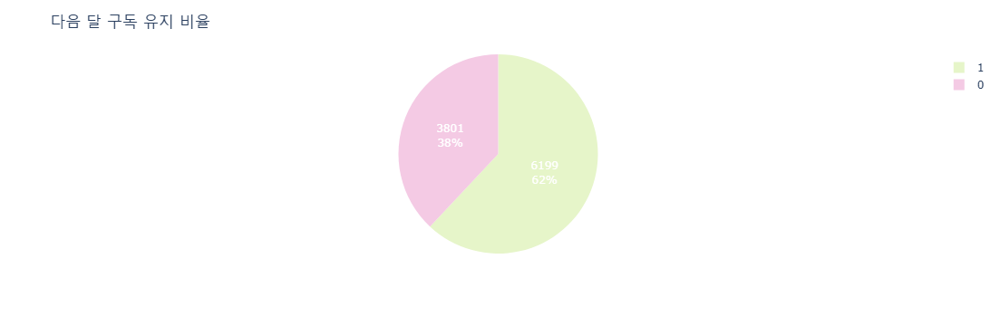

In [147]:
fig = px.pie(df_target, values='user_id', names = df_target.index, color_discrete_sequence = [px.colors.qualitative.Pastel2[4], px.colors.qualitative.Pastel2[3]])
fig.update_traces(textposition='auto', textinfo='percent+value', textfont_size=12, textfont_color='white')
fig.update_layout(showlegend = True, title_text = '다음 달 구독 유지 비율')
fig.show()

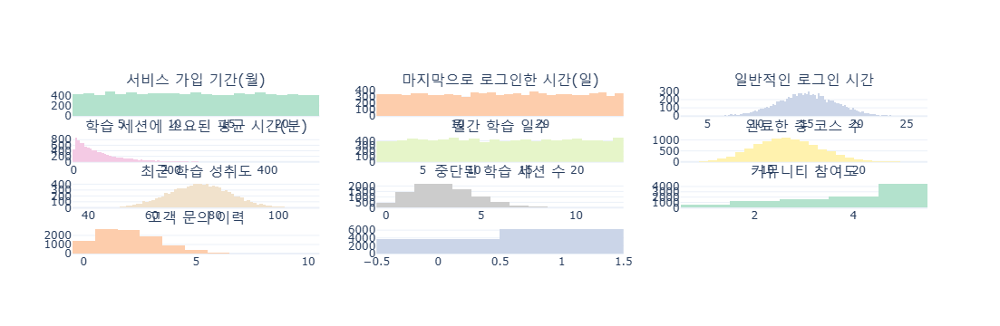

In [61]:
digital_data = data[['subscription_duration', 'recent_login_time',
       'average_login_time', 'average_time_per_learning_session',
       'monthly_active_learning_days', 'total_completed_courses',
       'recent_learning_achievement', 'abandoned_learning_sessions',
       'community_engagement_level','customer_inquiry_history', 'target']]

fig = make_subplots(rows = 4, cols = 3, 
                    subplot_titles = ("서비스 가입 기간(월)", "마지막으로 로그인한 시간(일)",
                                      "일반적인 로그인 시간", "학습 세션에 소요된 평균 시간(분)",
                                      "월간 학습 일수", "완료한 총 코스 수",
                                      "최근 학습 성취도", "중단된 학습 세션 수",
                                      "커뮤니티 참여도", "고객 문의 이력"))

colors = px.colors.qualitative.Pastel2

for i, col in enumerate(digital_data.columns):
    histogram = go.Histogram(
        x = digital_data[col],
        marker=dict(color=colors[i % len(colors)]))
    fig.add_trace(histogram, 
                  row = i // 3 + 1, 
                  col = i % 3 + 1)
    


fig.update_layout(height = 1600,
                  showlegend = False,
                  template = 'plotly_white')

fig.show()


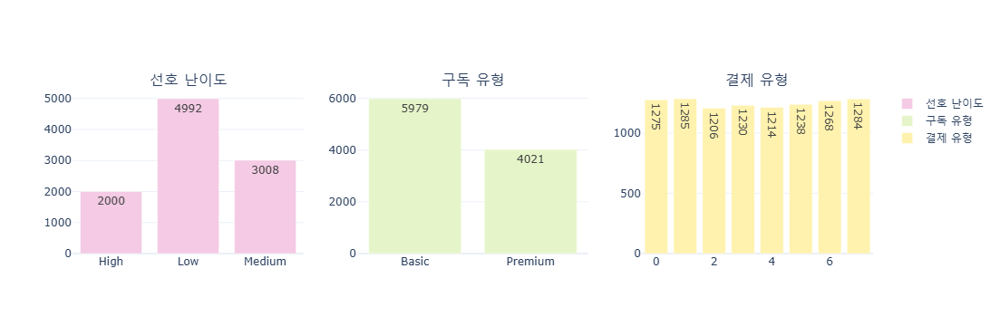

In [51]:
df1 = data.groupby('preferred_difficulty_level').count()
df2 = data.groupby('subscription_type').count()
df3 = data.groupby('payment_pattern').count()

dfs = [df1, df2, df3]
titles = ["선호 난이도", "구독 유형", "결제 유형"]
colors = px.colors.qualitative.Pastel2

fig = make_subplots(rows=1, cols=3, subplot_titles=titles)

for i, df in enumerate(dfs):
    fig.add_trace(
        go.Bar(
            x=df.index,
            y=df['user_id'],
            name=titles[i],
            text=df['user_id'], textposition='auto',
            marker_color=colors[i+3],
        ),
        row=1,
        col=i+1
    )

fig.update_traces(
    textfont_size=12,
    textposition="auto"
)

fig.update_layout(showlegend=True, template='plotly_white')

fig.show()

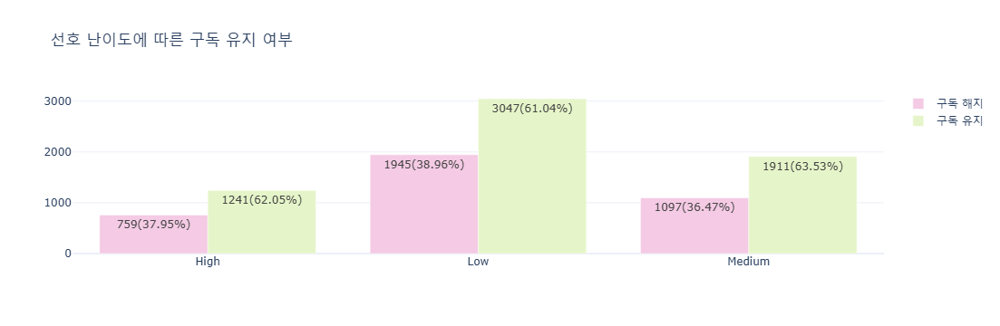

In [37]:
colors = px.colors.qualitative.Pastel2

df1_target_0 = data[data['target'] == 0].groupby('preferred_difficulty_level').count()
df1_target_1 = data[data['target'] == 1].groupby('preferred_difficulty_level').count()


df_total = df1_target_0['user_id'] + df1_target_1['user_id']

dfs = [df1_target_0, df1_target_1]
names = ['구독 해지', '구독 유지']

for df in dfs:
    df['percentage'] = (df['user_id'] / df_total) * 100


fig = go.Figure()

for i, df in enumerate(dfs):
    fig.add_trace(
        go.Bar(
            x = df.index,
            y = df['user_id'],
            name = names[i],
            text = [f"{u}({p:.2f}%)" for p, u in zip(df['percentage'], df['user_id'])],
            textposition = 'auto',
            marker_color=colors[i+3]
        )
    )

fig.update_traces(
    textfont_size = 12,
    textposition = "auto"
)

fig.update_layout(
    barmode = 'group',
    showlegend = True,
    title_text = "선호 난이도에 따른 구독 유지 여부",
    template = 'plotly_white'
)

fig.show()


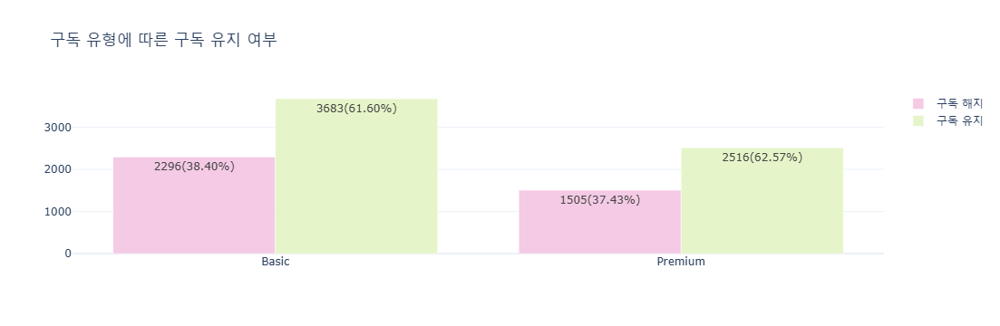

In [40]:
#구독 유형에 따른 구독 유지 여분
colors = px.colors.qualitative.Pastel2

df2_target_0 = data[data['target'] == 0].groupby('subscription_type').count()
df2_target_1 = data[data['target'] == 1].groupby('subscription_type').count()

df_total = df2_target_0['user_id'] + df2_target_1['user_id']

dfs = [df2_target_0, df2_target_1]
names = ['구독 해지', '구독 유지']

for df in dfs:
    df['percentage'] = (df['user_id'] / df_total) * 100

fig = go.Figure()

for i, df in enumerate(dfs):
    fig.add_trace(
        go.Bar(
            x = df.index,
            y = df['user_id'],
            name = names[i],
            text = [f"{u}({p:.2f}%)" for p, u in zip(df['percentage'], df['user_id'])],
            textposition = 'auto',
            marker_color=colors[i+3]
        )
    )

fig.update_traces(
    textfont_size = 12,
    textposition = "auto"
)

fig.update_layout(
    barmode = 'group',
    showlegend = True,
    title_text = "구독 유형에 따른 구독 유지 여부",
    template = 'plotly_white'
)

fig.show()

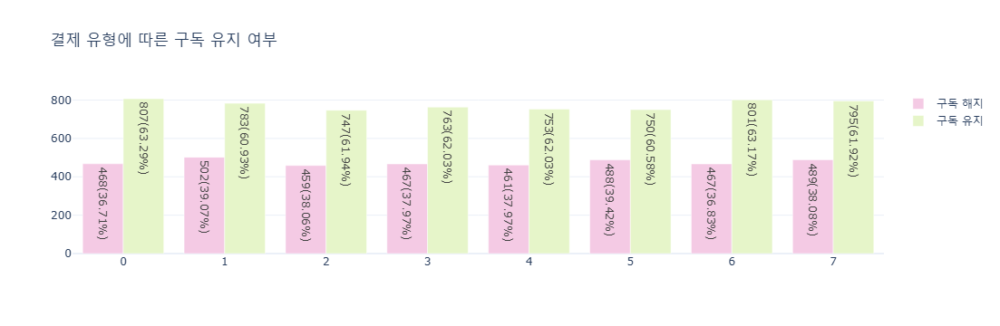

In [42]:
colors = px.colors.qualitative.Pastel2

df3_target0 = data[data['target']==0].groupby('payment_pattern').count()
df3_target1 = data[data['target']==1].groupby('payment_pattern').count()

df_total = df3_target0['user_id'] + df3_target1['user_id']

dfs = [df3_target0, df3_target1]
names = ['구독 해지', '구독 유지']

for df in dfs:
    df['percentage'] = (df['user_id'] / df_total) * 100

fig = go.Figure()

for i, df in enumerate(dfs):
    fig.add_trace(
        go.Bar(
            x = df.index,
            y = df['user_id'],
            name = names[i],
            text = [f'{u}({p:.2f}%)' for p, u in zip(df['percentage'],df['user_id'])],
            textposition = 'auto',
            marker_color = colors[i+3]
        )
    )
            
fig.update_traces(
    textfont_size = 12,
    textposition = "auto"
)

fig.update_layout(
    barmode = 'group',
    showlegend = True,
    title_text = "결제 유형에 따른 구독 유지 여부",
    template = 'plotly_white'
)

fig.show()

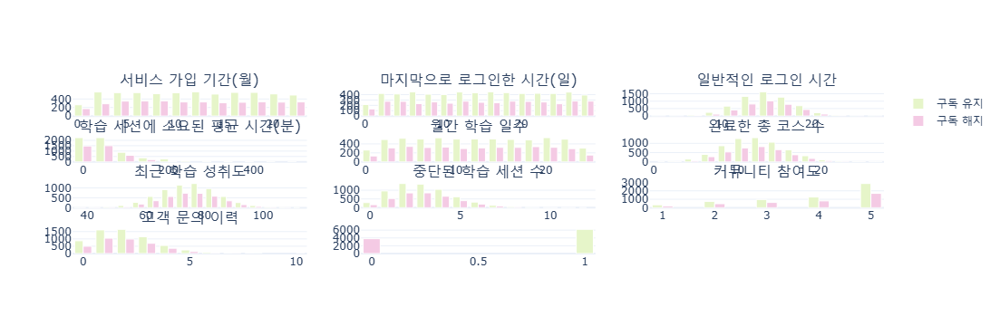

In [63]:
fig = make_subplots(rows = 4, cols = 3, 
                    subplot_titles = ("서비스 가입 기간(월)", "마지막으로 로그인한 시간(일)",
                                      "일반적인 로그인 시간", "학습 세션에 소요된 평균 시간(분)",
                                      "월간 학습 일수", "완료한 총 코스 수",
                                      "최근 학습 성취도", "중단된 학습 세션 수",
                                      "커뮤니티 참여도", "고객 문의 이력"))
names = ['구독 해지', '구독 유지']
colors = {'구독 유지': px.colors.qualitative.Pastel2[4], '구독 해지': px.colors.qualitative.Pastel2[3]}

for i, col in enumerate(digital_data.columns):
    histogram_1 = go.Histogram(x = digital_data[digital_data['target'] == 1][col], 
                               name = names[1],
                               nbinsx = 20,
                               marker=dict(color=colors['구독 유지']),
                               showlegend=True if i == 0 else False 
                               )

    fig.add_trace(histogram_1,
                  row = i // 3 + 1,
                  col = i % 3 + 1)

for i, col in enumerate(digital_data.columns):
    histogram_0 = go.Histogram(x = digital_data[digital_data['target'] == 0][col], 
                               name = names[0],
                               nbinsx = 20,
                               marker=dict(color=colors['구독 해지']),
                               showlegend=True if i == 0 else False
                               )
    
    fig.add_trace(histogram_0,
                  row = i // 3 + 1,
                  col = i % 3 + 1)

fig.update_layout(height = 1600,
                  showlegend = True,
                  template = 'plotly_white'
                 )
fig.update_traces(marker_line_color = 'white', marker_line_width = 1)

fig.show()

In [67]:
columns1 = ['subscription_duration', 'recent_login_time', 'average_login_time', 
                   'average_time_per_learning_session', 'monthly_active_learning_days']
columns2 = ['total_completed_courses', 'recent_learning_achievement', 
                   'abandoned_learning_sessions', 'community_engagement_level', 
                   'customer_inquiry_history']

summary_stats1 = data.groupby('target')[columns1].agg(['mean', 'std', 'median'])
summary_stats2 = data.groupby('target')[columns2].agg(['mean', 'std', 'median'])
display(summary_stats1)
display(summary_stats2)

subscription_duration                  recent_login_time           \
                        mean       std median              mean      std   
target                                                                     
0                  11.953959  6.618295   12.0         15.057880  8.42873   
1                  11.862720  6.590500   12.0         14.985804  8.32231   

              average_login_time                       \
       median               mean       std     median   
target                                                  
0        15.0          15.026762  2.956732  14.979239   
1        15.0          14.974035  3.029275  14.979217   

       average_time_per_learning_session                        \
                                    mean        std     median   
target                                                           
0                              46.456986  39.639733  34.773346   
1                              60.105533  63.477523  39.705116   

       monthly_active_learning_days                   
                               mean       std median  
target                                                
0                         12.502236  6.854200   13.0  
1                         12.571866  6.980077   12.0

total_completed_courses                  recent_learning_achievement  \
                          mean       std median                        mean   
target                                                                        
0                    12.246251  3.630554   12.0                   75.000310   
1                    12.216003  3.636558   12.0                   75.047419   

                             abandoned_learning_sessions                   \
              std     median                        mean       std median   
target                                                                      
0        9.873574  74.981448                    3.087609  1.755430    3.0   
1       10.027058  75.199591                    3.016616  1.754416    3.0   

       community_engagement_level                  customer_inquiry_history  \
                             mean       std median                     mean   
target                                                                        
0                        3.870560  1.259105    4.0                 2.009997   
1                        3.895628  1.264061    4.0                 2.010808   

                         
             std median  
target                   
0       1.409145    2.0  
1       1.428306    2.0

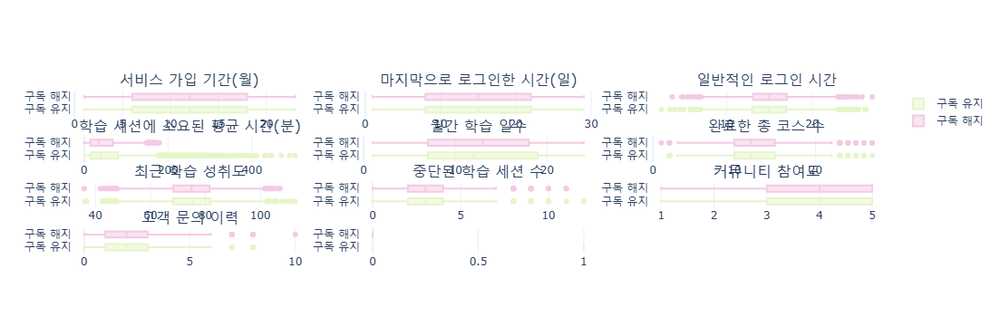

In [119]:
fig = make_subplots(rows = 4, cols = 3, 
                    subplot_titles = ("서비스 가입 기간(월)", "마지막으로 로그인한 시간(일)",
                                      "일반적인 로그인 시간", "학습 세션에 소요된 평균 시간(분)",
                                      "월간 학습 일수", "완료한 총 코스 수",
                                      "최근 학습 성취도", "중단된 학습 세션 수",
                                      "커뮤니티 참여도", "고객 문의 이력"))
names = ['구독 해지', '구독 유지']
colors = {'구독 유지': px.colors.qualitative.Pastel2[4], '구독 해지': px.colors.qualitative.Pastel2[3]}

for i, col in enumerate(digital_data.columns):
    box_1 = go.Box(x = digital_data[digital_data['target'] == 1][col], 
                               name = names[1],
                               marker=dict(color=colors['구독 유지']),
                               showlegend=True if i == 0 else False 
                               )

    fig.add_trace(box_1,
                  row = i // 3 + 1,
                  col = i % 3 + 1)

for i, col in enumerate(digital_data.columns):
    box_0 = go.Box(x = digital_data[digital_data['target'] == 0][col], 
                               name = names[0],
                               marker=dict(color=colors['구독 해지']),
                               showlegend=True if i == 0 else False
                               )
    
    fig.add_trace(box_0,
                  row = i // 3 + 1,
                  col = i % 3 + 1)

fig.update_layout(height = 1600,
                  showlegend = True,
                  template = 'plotly_white'
                 )

fig.show()

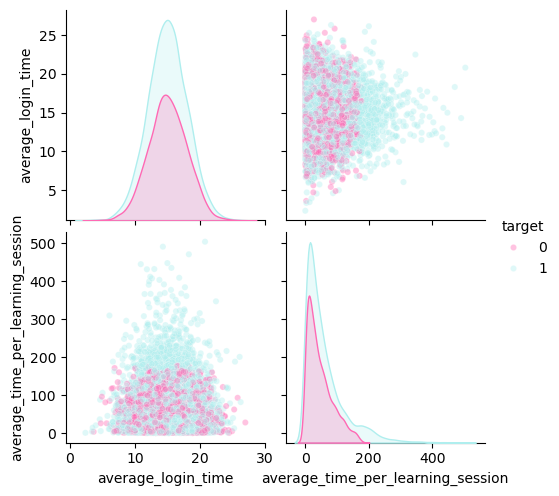

In [113]:
col = ['average_login_time', 'average_time_per_learning_session']
sns.pairplot(data, vars=col, hue='target', palette=['#FF69B4', '#AFEEEE'], plot_kws={'alpha': 0.4, 's': 20})
plt.show()

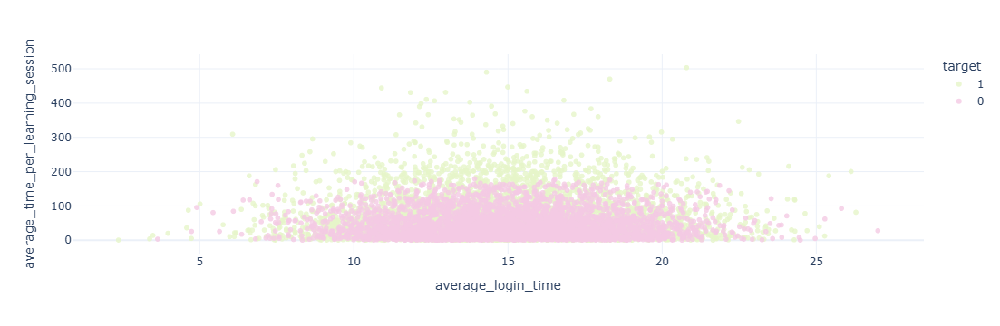

In [177]:
data['target'] = data['target'].astype(str)

fig = px.scatter(data, x = "average_login_time", y = "average_time_per_learning_session",
                color = "target",
                opacity = 0.8,
                color_discrete_sequence =[px.colors.qualitative.Pastel2[4], px.colors.qualitative.Pastel2[3]],
                category_orders={"target": ["1", "0"]})
fig.update_layout(showlegend = True,
                  template = 'plotly_white'
                 )

fig.show()

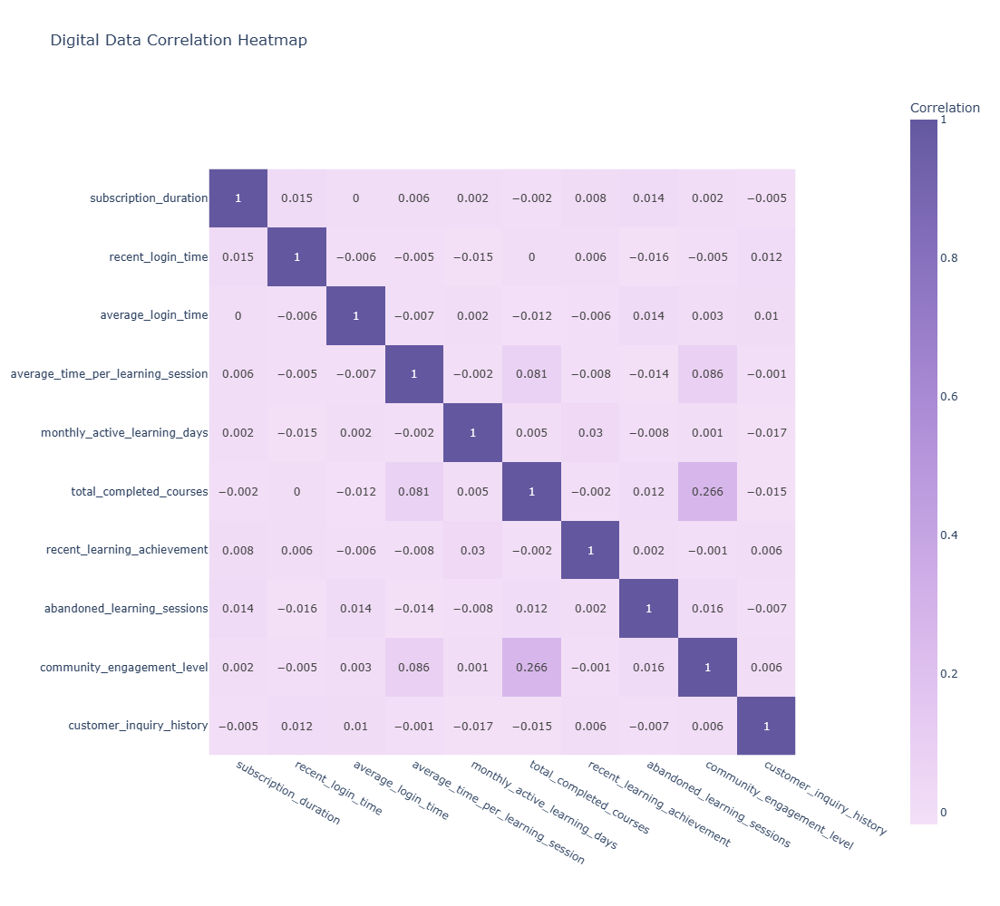

In [197]:
digital_data = data[['subscription_duration', 'recent_login_time',
       'average_login_time', 'average_time_per_learning_session',
       'monthly_active_learning_days', 'total_completed_courses',
       'recent_learning_achievement', 'abandoned_learning_sessions',
       'community_engagement_level','customer_inquiry_history']]

correlation_matrix = digital_data.corr().round(3)

fig = px.imshow(correlation_matrix,
                text_auto=True,
                color_continuous_scale='Purp',
                labels={'color': 'Correlation'},
                title='Digital Data Correlation Heatmap')

fig.update_layout(
    template='plotly_white',
    width = 1000,
    height = 1000
)

fig.show()

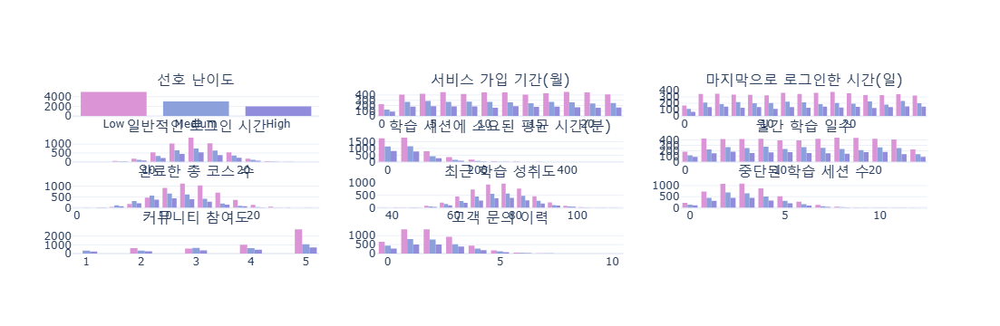

In [214]:
data_level = data[['preferred_difficulty_level', 'subscription_duration', 'recent_login_time','average_login_time', 'average_time_per_learning_session',
       'monthly_active_learning_days', 'total_completed_courses','recent_learning_achievement', 'abandoned_learning_sessions',
       'community_engagement_level','customer_inquiry_history']]

fig = make_subplots(rows = 4, cols = 3, 
                    subplot_titles = ("선호 난이도", "서비스 가입 기간(월)", "마지막으로 로그인한 시간(일)",
                                      "일반적인 로그인 시간", "학습 세션에 소요된 평균 시간(분)",
                                      "월간 학습 일수", "완료한 총 코스 수",
                                      "최근 학습 성취도", "중단된 학습 세션 수",
                                      "커뮤니티 참여도", "고객 문의 이력"))

for i, col in enumerate(data_level.columns):
    row_num = i // 3 + 1
    col_num = i % 3 + 1

    histogram_low = go.Histogram(x = data_level[data_level['preferred_difficulty_level'] == 'Low'][col], 
                                 nbinsx = 20, 
                                 name = f"Low: {col}",
                                 marker_color = '#DB95D6')
    
    fig.add_trace(histogram_low, row = row_num, col = col_num)

for i, col in enumerate(data_level.columns):
    row_num = i // 3 + 1
    col_num = i % 3 + 1

    histogram_medium = go.Histogram(x = data_level[data_level['preferred_difficulty_level'] == 'Medium'][col], 
                                    nbinsx = 20, 
                                    name = f"Medium: {col}",
                                    marker_color = '#8CA1DB')
    
    
    fig.add_trace(histogram_medium, row = row_num, col = col_num)

for i, col in enumerate(data_level.columns):
    row_num = i // 3 + 1
    col_num = i % 3 + 1

    histogram_high = go.Histogram(x = data_level[data_level['preferred_difficulty_level'] == 'High'][col], 
                                  nbinsx = 20, 
                                  name = f"High: {col}",
                                  marker_color = '#918CDB')
   
    fig.add_trace(histogram_high, row = row_num, col = col_num)

fig.update_layout(showlegend = False, 
                  legend = dict(y = 1.1, x = 0.5, orientation = 'h'),
                  height = 1200,
                  template = 'plotly_white')

fig.show()

In [226]:
columns1 = ['subscription_duration', 'recent_login_time', 'average_login_time', 
                   'average_time_per_learning_session', 'monthly_active_learning_days']
columns2 = ['total_completed_courses', 'recent_learning_achievement', 
                   'abandoned_learning_sessions', 'community_engagement_level', 
                   'customer_inquiry_history']

summary_stats1 = data_level.groupby('preferred_difficulty_level')[columns1].agg(['mean', 'std', 'median']).round(3)
summary_stats2 = data_level.groupby('preferred_difficulty_level')[columns2].agg(['mean', 'std', 'median']).round(3)

display(summary_stats1)
display(summary_stats2)

subscription_duration                \
                                            mean    std median   
preferred_difficulty_level                                       
High                                      11.760  6.579   12.0   
Low                                       12.017  6.615   12.0   
Medium                                    11.789  6.591   12.0   

                           recent_login_time               average_login_time  \
                                        mean    std median               mean   
preferred_difficulty_level                                                      
High                                  15.163  8.481   15.0             14.886   
Low                                   14.957  8.290   15.0             14.992   
Medium                                15.006  8.405   15.0             15.069   

                                          average_time_per_learning_session  \
                              std  median                              mean   
preferred_difficulty_level                                                    
High                        3.023  14.847                            48.361   
Low                         2.996  15.002                            59.896   
Medium                      2.996  15.026                            51.015   

                                           monthly_active_learning_days  \
                               std  median                         mean   
preferred_difficulty_level                                                
High                        49.436  33.949                       12.369   
Low                         60.402  41.662                       12.615   
Medium                      51.689  35.027                       12.547   

                                          
                              std median  
preferred_difficulty_level                
High                        6.942   12.0  
Low                         6.937   13.0  
Medium                      6.917   12.0

total_completed_courses                \
                                              mean    std median   
preferred_difficulty_level                                         
High                                        11.202  3.494   11.0   
Low                                         13.271  3.488   13.0   
Medium                                      11.177  3.464   11.0   

                           recent_learning_achievement                  \
                                                  mean     std  median   
preferred_difficulty_level                                               
High                                            75.107  10.002  75.109   
Low                                             75.138   9.950  75.196   
Medium                                          74.799   9.977  74.983   

                           abandoned_learning_sessions                \
                                                  mean    std median   
preferred_difficulty_level                                             
High                                             2.970  1.755    3.0   
Low                                              3.079  1.754    3.0   
Medium                                           3.034  1.755    3.0   

                           community_engagement_level                \
                                                 mean    std median   
preferred_difficulty_level                                            
High                                            3.579  1.372    4.0   
Low                                             4.192  1.064    5.0   
Medium                                          3.582  1.363    4.0   

                           customer_inquiry_history                
                                               mean    std median  
preferred_difficulty_level                                         
High                                          2.058  1.464    2.0  
Low                                           2.001  1.394    2.0  
Medium                                        1.995  1.436    2.0

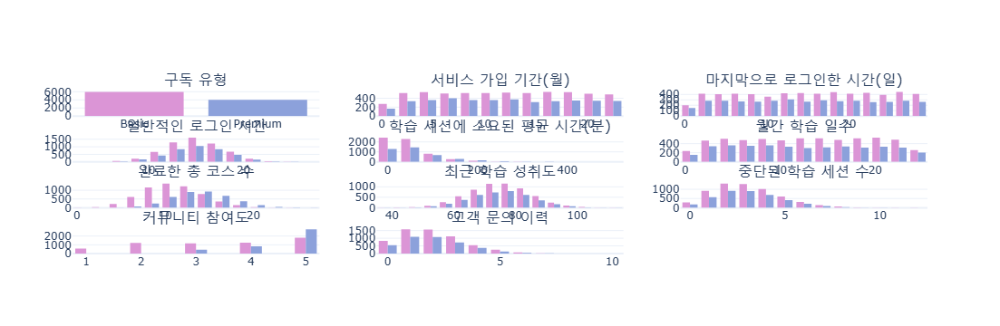

In [230]:
data_subscription = data[['subscription_type', 'subscription_duration', 'recent_login_time','average_login_time', 'average_time_per_learning_session',
       'monthly_active_learning_days', 'total_completed_courses','recent_learning_achievement', 'abandoned_learning_sessions',
       'community_engagement_level','customer_inquiry_history']]

fig = make_subplots(rows = 4, cols = 3, 
                    subplot_titles = ("구독 유형", "서비스 가입 기간(월)", "마지막으로 로그인한 시간(일)",
                                      "일반적인 로그인 시간", "학습 세션에 소요된 평균 시간(분)",
                                      "월간 학습 일수", "완료한 총 코스 수",
                                      "최근 학습 성취도", "중단된 학습 세션 수",
                                      "커뮤니티 참여도", "고객 문의 이력"))

for i, col in enumerate(data_subscription.columns):
    row_num = i // 3 + 1
    col_num = i % 3 + 1

    histogram_basic = go.Histogram(x = data_subscription[data_subscription['subscription_type'] == 'Basic'][col], 
                                 nbinsx = 20, 
                                 name = f"Low: {col}",
                                 marker_color = '#DB95D6')
    
    fig.add_trace(histogram_basic, row = row_num, col = col_num)

for i, col in enumerate(data_subscription.columns):
    row_num = i // 3 + 1
    col_num = i % 3 + 1

    histogram_premium = go.Histogram(x = data_subscription[data_subscription['subscription_type'] == 'Premium'][col], 
                                    nbinsx = 20, 
                                    name = f"Medium: {col}",
                                    marker_color = '#8CA1DB')
    
    
    fig.add_trace(histogram_premium, row = row_num, col = col_num)

fig.update_layout(showlegend = False, 
                  legend = dict(y = 1.1, x = 0.5, orientation = 'h'),
                  height = 1200,
                  template = 'plotly_white')

fig.show()

In [232]:
columns1 = ['subscription_duration', 'recent_login_time', 'average_login_time', 
                   'average_time_per_learning_session', 'monthly_active_learning_days']
columns2 = ['total_completed_courses', 'recent_learning_achievement', 
                   'abandoned_learning_sessions', 'community_engagement_level', 
                   'customer_inquiry_history']

summary_stats1 = data_subscription.groupby('subscription_type')[columns1].agg(['mean', 'std', 'median']).round(3)
summary_stats2 = data_subscription.groupby('subscription_type')[columns2].agg(['mean', 'std', 'median']).round(3)

display(summary_stats1)
display(summary_stats2)

subscription_duration               recent_login_time  \
                                   mean    std median              mean   
subscription_type                                                         
Basic                            11.913  6.618   12.0            15.138   
Premium                          11.874  6.577   12.0            14.828   

                                average_login_time                 \
                     std median               mean    std  median   
subscription_type                                                   
Basic              8.369   15.0             14.974  2.968  14.951   
Premium            8.350   15.0             15.024  3.051  15.015   

                  average_time_per_learning_session                  \
                                               mean     std  median   
subscription_type                                                     
Basic                                        48.402  48.662  33.818   
Premium                                      64.607  64.254  44.837   

                  monthly_active_learning_days                
                                          mean    std median  
subscription_type                                             
Basic                                   12.643  6.901   13.0  
Premium                                 12.400  6.977   12.0

total_completed_courses                \
                                     mean    std median   
subscription_type                                         
Basic                              11.016  3.318   11.0   
Premium                            14.029  3.324   14.0   

                  recent_learning_achievement                 \
                                         mean    std  median   
subscription_type                                              
Basic                                  75.087  9.962  75.120   
Premium                                74.944  9.979  75.128   

                  abandoned_learning_sessions                \
                                         mean    std median   
subscription_type                                             
Basic                                   3.046  1.788    3.0   
Premium                                 3.040  1.705    3.0   

                  community_engagement_level                \
                                        mean    std median   
subscription_type                                            
Basic                                  3.420  1.348    4.0   
Premium                                4.579  0.677    5.0   

                  customer_inquiry_history                
                                      mean    std median  
subscription_type                                         
Basic                                2.020  1.421    2.0  
Premium                              1.997  1.422    2.0

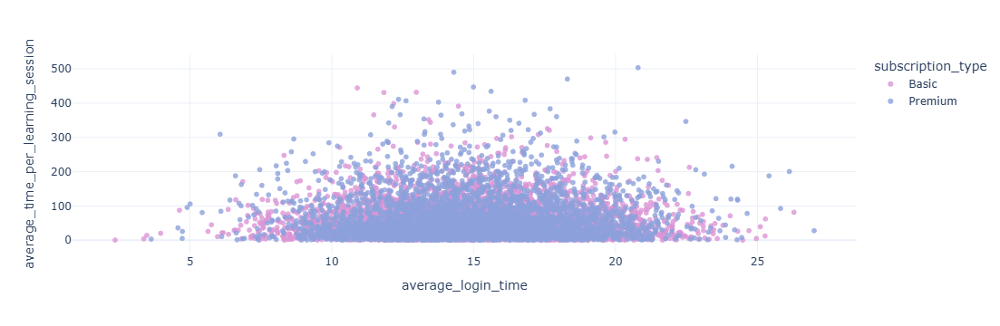

In [240]:
data['subscription_type'] = data['subscription_type'].astype(str)

fig = px.scatter(data, x = "average_login_time", y = "average_time_per_learning_session",
                color = "subscription_type",
                opacity = 0.8,
                color_discrete_sequence =['#DB95D6', '#8CA1DB'],
                category_orders={"subscription_type": ["Basic", "Premium"]})
fig.update_layout(showlegend = True,
                  template = 'plotly_white'
                 )

fig.show()

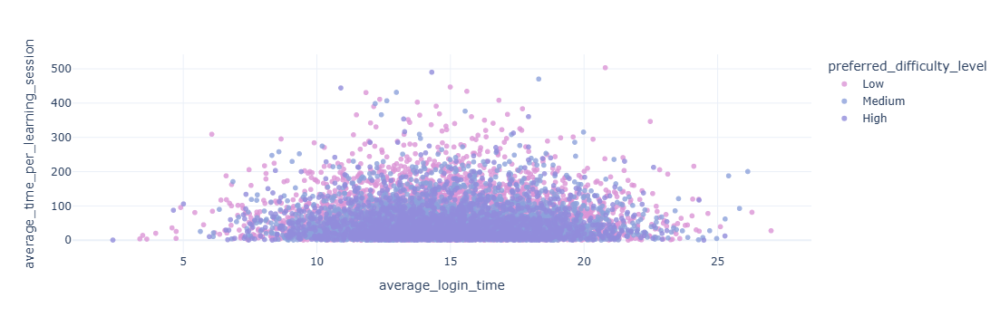

In [238]:
fig = px.scatter(data, x = "average_login_time", y = "average_time_per_learning_session",
                color = "preferred_difficulty_level",
                opacity = 0.8,
                color_discrete_sequence =['#DB95D6', '#8CA1DB', '#918CDB'],
                category_orders={"preferred_difficulty_level": ["low", "medium", "Hard"]})
fig.update_layout(showlegend = True,
                  template = 'plotly_white'
                 )

fig.show()

In [248]:
import pandas as pd

group1 = (data['subscription_type'] == 'Premium') & (data['preferred_difficulty_level'] == 'Low')
group2 = (data['subscription_type'] == 'Premium') & (data['preferred_difficulty_level'].isin(['Medium', 'High']))
group3 = (data['subscription_type'] == 'Basic') & (data['preferred_difficulty_level'] == 'Low')
group4 = (data['subscription_type'] == 'Basic') & (data['preferred_difficulty_level'].isin(['Medium', 'High']))

group1_data = data[group1]
group2_data = data[group2]
group3_data = data[group3]
group4_data = data[group4]

columns_to_compare = ['community_engagement_level', 'total_completed_courses', 'average_time_per_learning_session']

summary_group1 = group1_data[columns_to_compare].describe()
summary_group2 = group2_data[columns_to_compare].describe()
summary_group3 = group3_data[columns_to_compare].describe()
summary_group4 = group4_data[columns_to_compare].describe()

print("Premium & Low 난이도")
print(summary_group1)
print("\nPremium & Medium/High 난이도")
print(summary_group2)
print("\nBasic & Low 난이도")
print(summary_group3)
print("\nBasic & Medium/High 난이도")
print(summary_group4)

Premium & Low 난이도
       community_engagement_level  total_completed_courses  \
count                 1983.000000              1983.000000   
mean                     4.797781                15.065557   
std                      0.401756                 3.207071   
min                      4.000000                 6.000000   
25%                      5.000000                13.000000   
50%                      5.000000                15.000000   
75%                      5.000000                17.000000   
max                      5.000000                27.000000   

       average_time_per_learning_session  
count                        1983.000000  
mean                           70.988540  
std                            69.548914  
min                             0.058419  
25%                            20.308288  
50%                            49.463637  
75%                           100.102516  
max                           503.372616  

Premium & Medium/High 난이도
       co

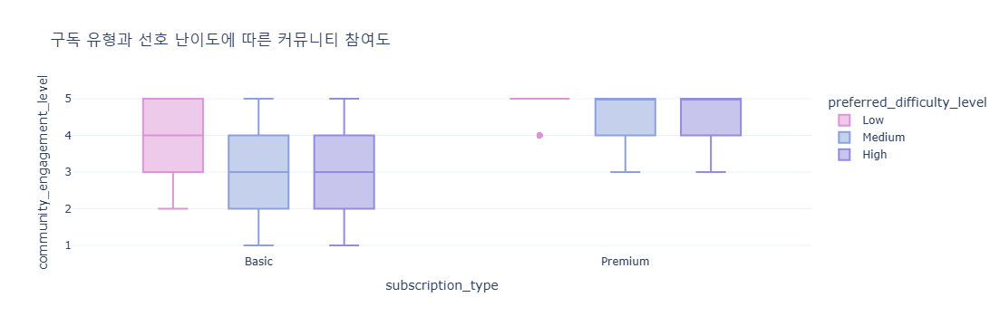

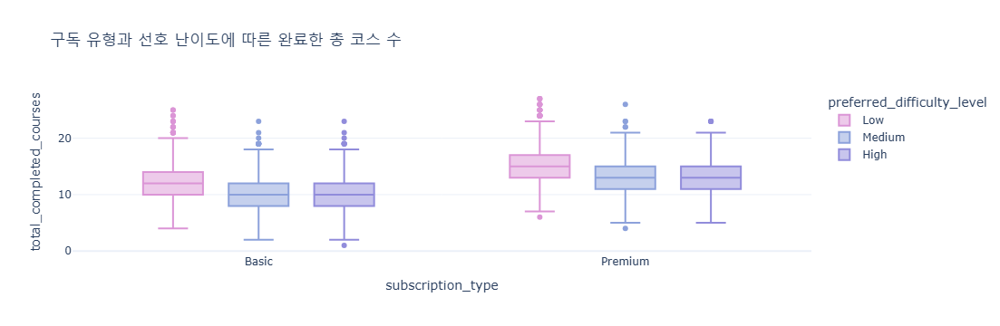

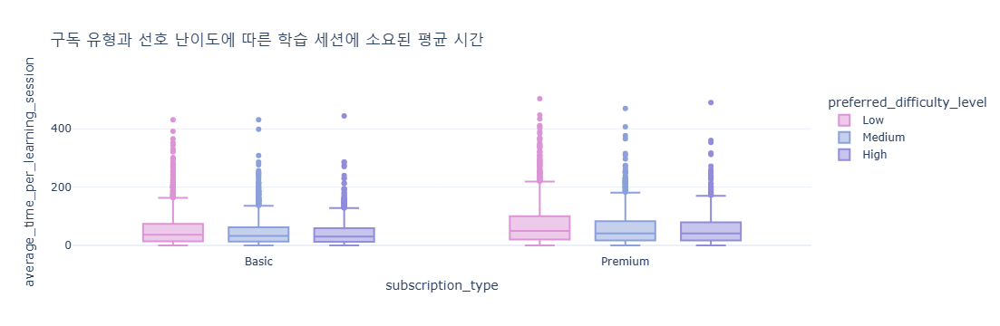

In [261]:
fig1 = px.box(data, 
              x='subscription_type', 
              y='community_engagement_level', 
              color='preferred_difficulty_level',
              color_discrete_map={'Low': '#DB95D6', 'Medium': '#8CA1DB', 'High': '#918CDB'},
              title='구독 유형과 선호 난이도에 따른 커뮤니티 참여도')
fig1.update_layout(template = 'plotly_white',
                  height = 400)
fig1.show()

fig2 = px.box(data, 
              x='subscription_type', 
              y='total_completed_courses', 
              color='preferred_difficulty_level',
              color_discrete_map={'Low': '#DB95D6', 'Medium': '#8CA1DB', 'High': '#918CDB'},
              title='구독 유형과 선호 난이도에 따른 완료한 총 코스 수')
fig2.update_layout(template = 'plotly_white',
                  height = 400)
fig2.show()

fig3 = px.box(data, 
              x='subscription_type', 
              y='average_time_per_learning_session', 
              color='preferred_difficulty_level',
              color_discrete_map={'Low': '#DB95D6', 'Medium': '#8CA1DB', 'High': '#918CDB'},
              title='구독 유형과 선호 난이도에 따른 학습 세션에 소요된 평균 시간')
fig3.update_layout(template = 'plotly_white',
                  height = 400)
fig3.show()